# stLearn on Maynard samples

Run the pipeline described in the stLearn [stSME clustering tutorial](https://stlearn.readthedocs.io/en/latest/stSME_clustering.html#Human-Brain-dorsolateral-prefrontal-cortex-(DLPFC)) on the Maynard samples.

## Setup

In [85]:
import os
from pathlib import Path
import numpy as np
import pandas as pd
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import LabelEncoder
import stlearn as st

WORKDIR = Path("/fh/fast/gottardo_r/data_transfer/spatial-datasets/")
OUTDIR = WORKDIR / "results/stLearn_HVGs"

Use the number of clusters defined in each sample's ground truth (per spatialLIBD)

In [73]:
N_CLUSTERS = {
    "151507": 7,
    "151508": 7,
    "151509": 7,
    "151510": 7,
    "151669": 5,
    "151670": 5,
    "151671": 5,
    "151672": 5,
    "151673": 7,
    "151674": 7,
    "151675": 7,
    "151676": 7
}

## stLearn

This function was copied nearly directly from the tutorial. It omits the ARI calculation with respect to the ground truth, but otherwise runs the stSME smoothing and clusters the smoothed expression.

Note: I moved this to a script, but couldn't run directly on a gizmo node (the code tried using the node's GPU and bonked), so I just ran in a loop in this notebook. Not super efficient, but each sample takes about 10 min for a ~2hr total runtime.

In [77]:
def run_stLearn(sample):
    # set up
    n_cluster = N_CLUSTERS[sample]
    BASE_PATH = WORKDIR / f"data/raw/spatialLIBD/{sample}"
    TILE_PATH = BASE_PATH / "tiles"
    if not os.path.exists(TILE_PATH):
        os.mkdir(TILE_PATH)
        
    markers = pd.read_csv(WORKDIR / "data/raw/spatialLIBD"/ sample / "HVGs.csv")
    
    # Load and preprocess data
    data = st.Read10X(BASE_PATH)
    data = data[:, markers.gene_name]
    
    st.pp.filter_genes(data,min_cells=1)
    st.pp.normalize_total(data)
    st.pp.log1p(data)
    st.pp.scale(data)
    
    # deep l3arning
    st.pp.tiling(data, TILE_PATH, crop_size=40)
    st.pp.extract_feature(data)
    
    # normalized PCA
    st.em.run_pca(data,n_comps=50)
    st.spatial.morphology.adjust(data,use_data="X_pca",radius=90,method="mean")
    data.obsm['X_pca'] = data.obsm['X_pca_morphology']
    
    # K-means on PCA
    st.tl.clustering.kmeans(data, n_clusters=n_cluster, use_data="X_pca", key_added="X_pca_kmeans")
    st.pl.cluster_plot(data, use_label="X_pca_kmeans",
                       output = str(OUTDIR / "figures"), name=f"{sample}_pca_kmeans")
    
    ## K-means on UMAP
    st.pp.neighbors(data,n_neighbors=5)
    st.em.run_umap(data)
    st.tl.clustering.kmeans(data, n_clusters=n_cluster, use_data="X_umap", key_added="X_umap_kmeans")
    st.pl.cluster_plot(data, use_label="X_umap_kmeans",
                       output = str(OUTDIR / "figures"), name=f"{sample}_umap_kmeans")
                       
    ## Save results
    clusters = data.obs[["X_pca_kmeans", "X_umap_kmeans"]]
    clusters.index = clusters.index.rename("barcode")
    clusters = clusters.reset_index()
    clusters = clusters.rename(columns=lambda x: x.strip('X_'))
    clusters.to_csv(OUTDIR/f"clusters/{sample}.csv", index=False)

Running stLearn on 151507


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


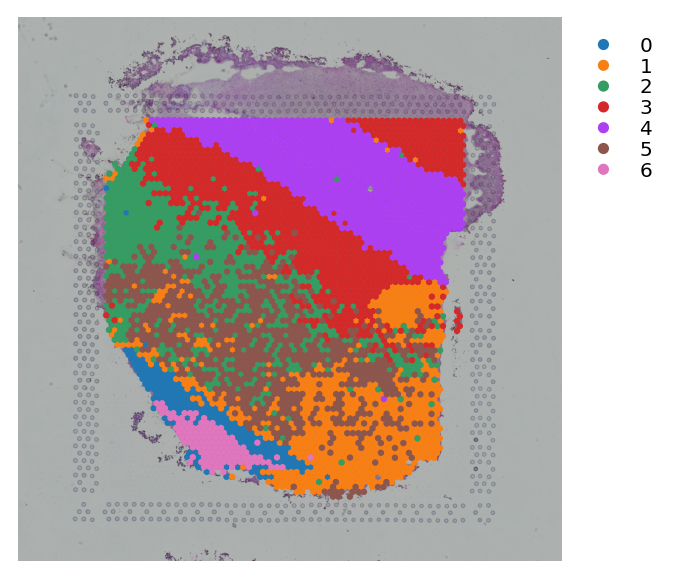

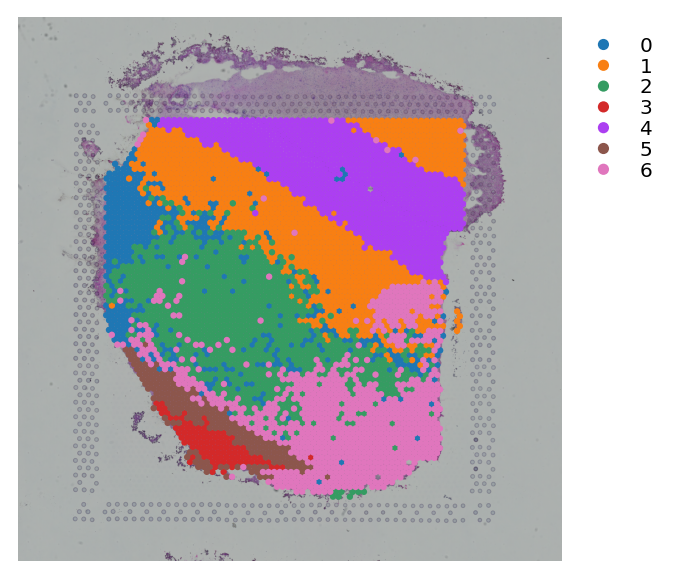

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


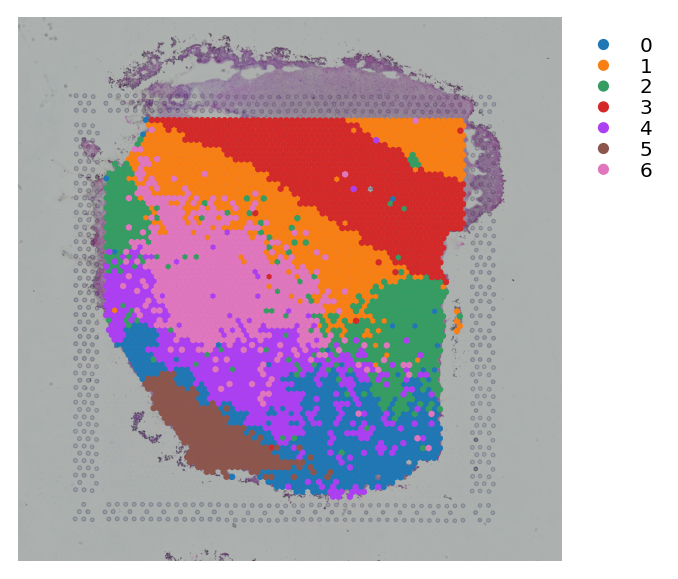

Running stLearn on 151508


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


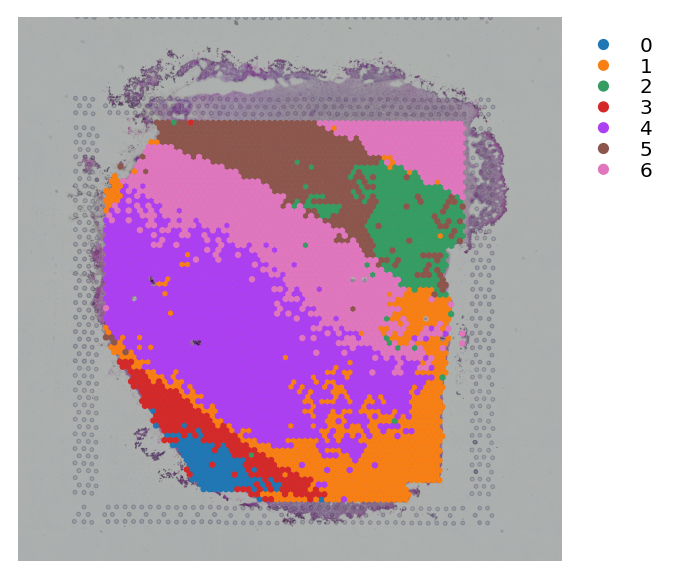

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


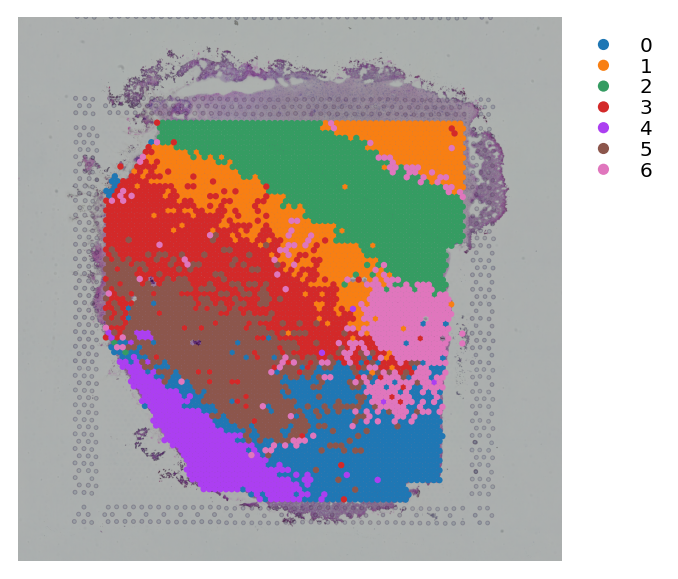

Running stLearn on 151509


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]  


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


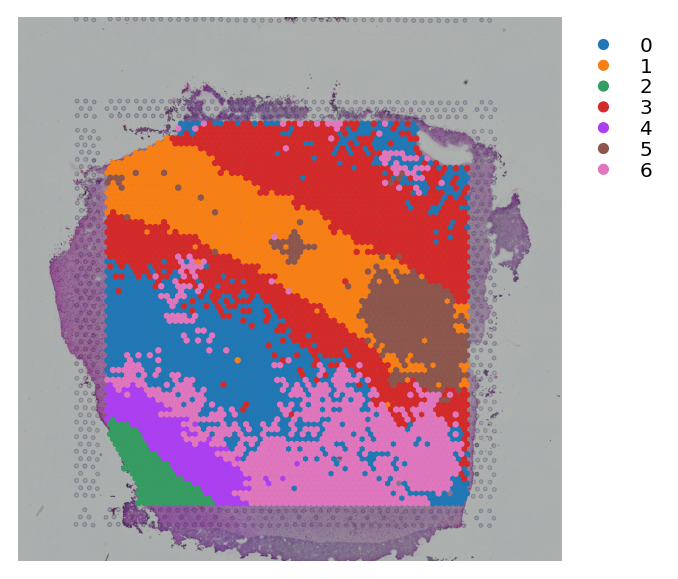

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


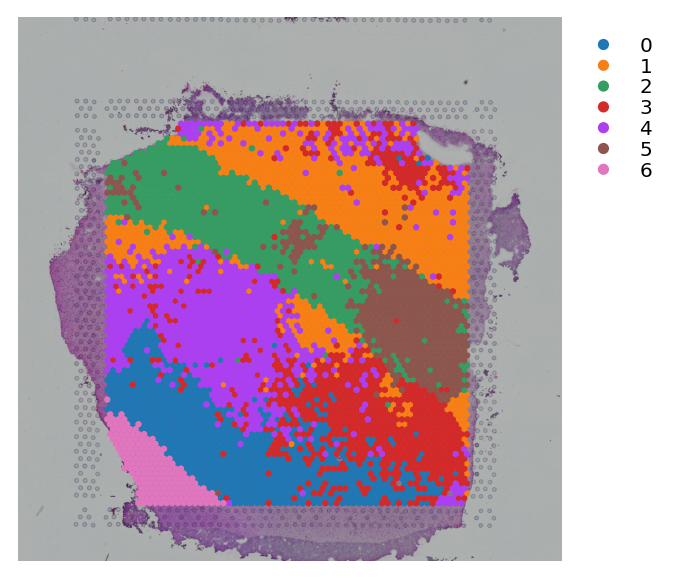

Running stLearn on 151510


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]  


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


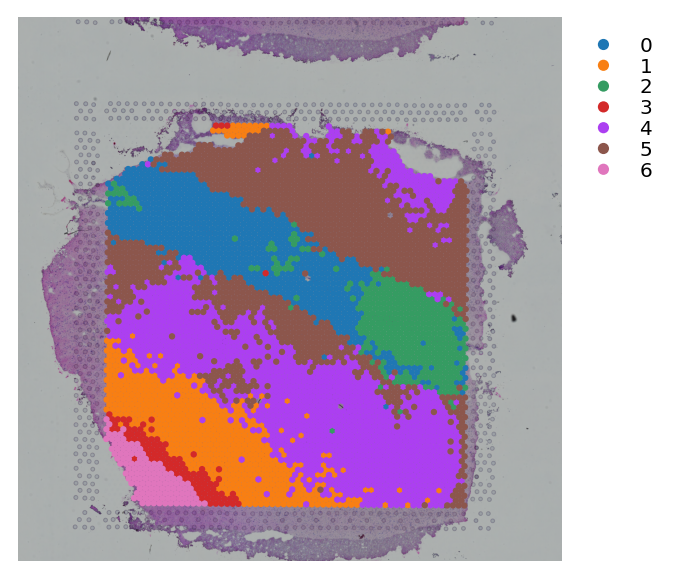

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


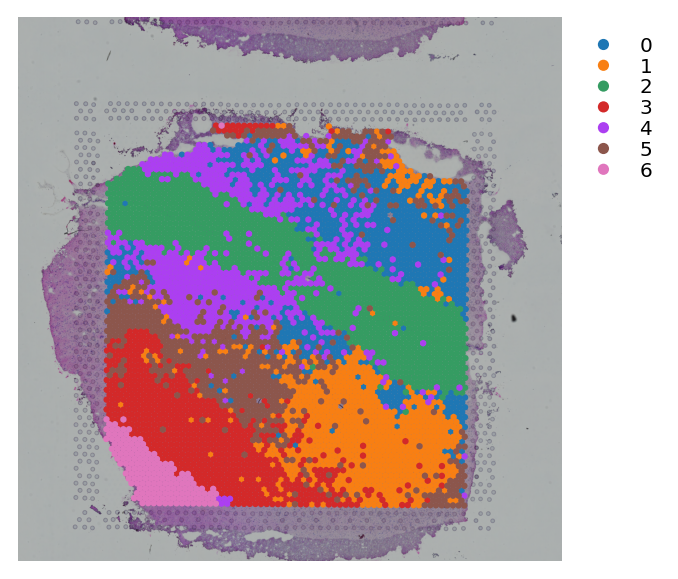

Running stLearn on 151669


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


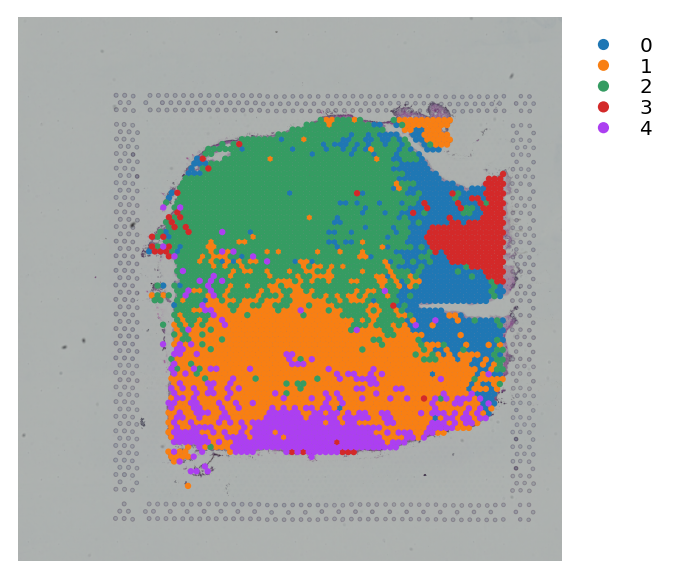

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


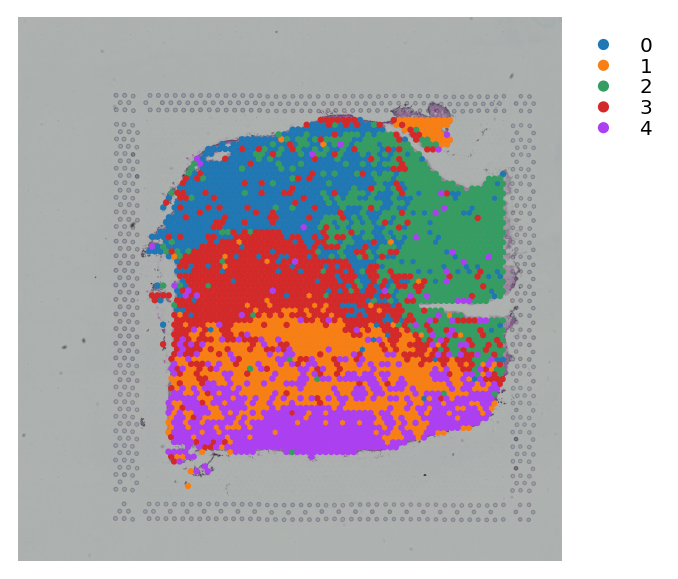

Running stLearn on 151670


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


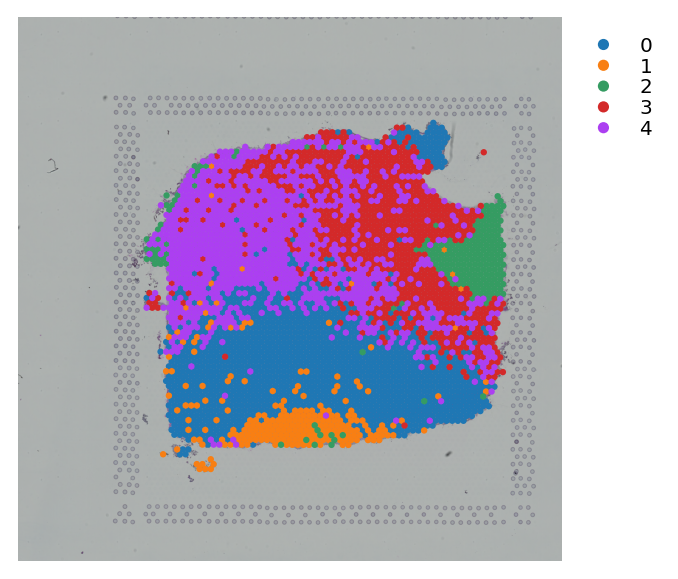

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


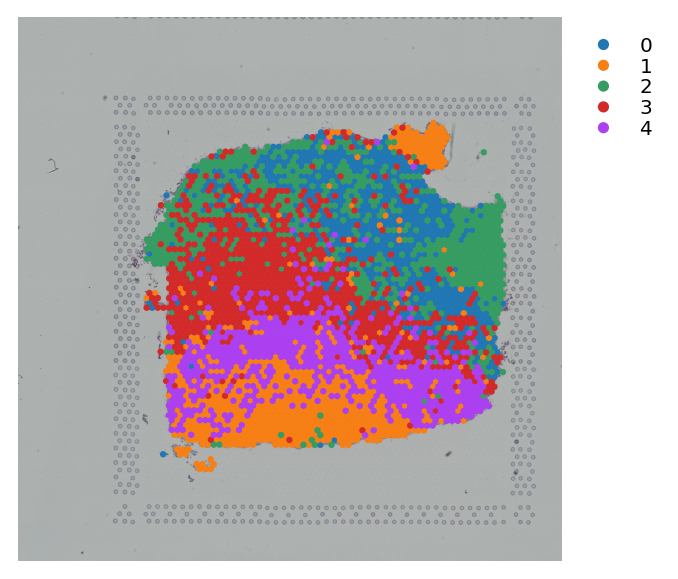

Running stLearn on 151671


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


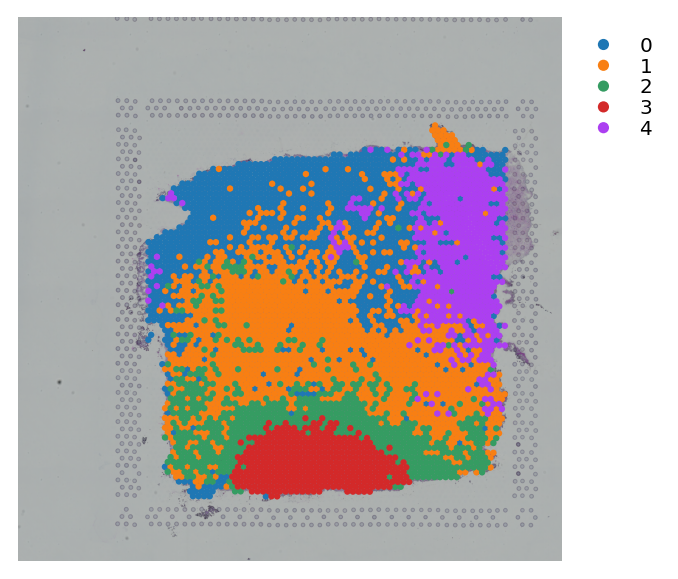

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


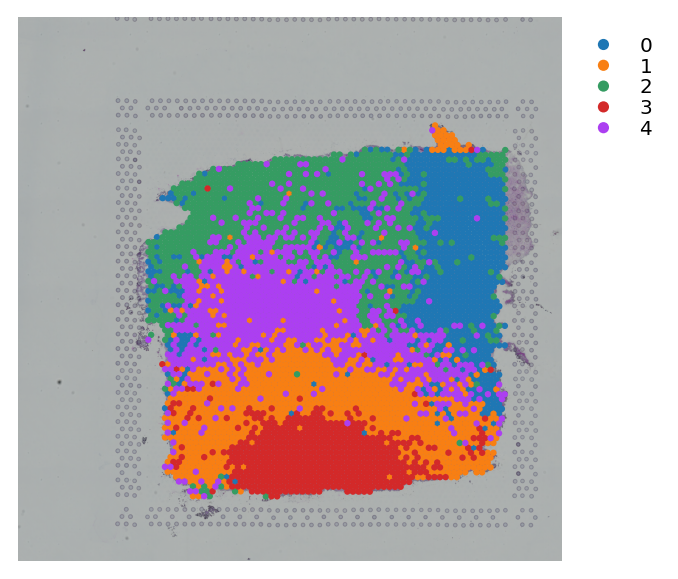

Running stLearn on 151672


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


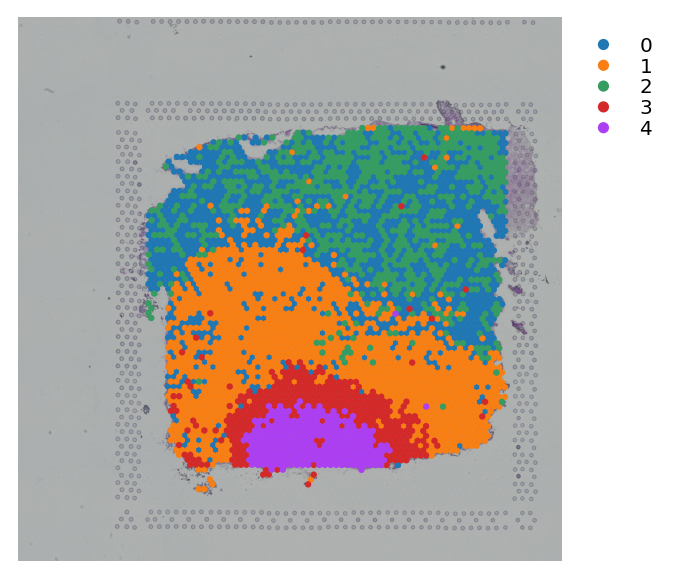

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


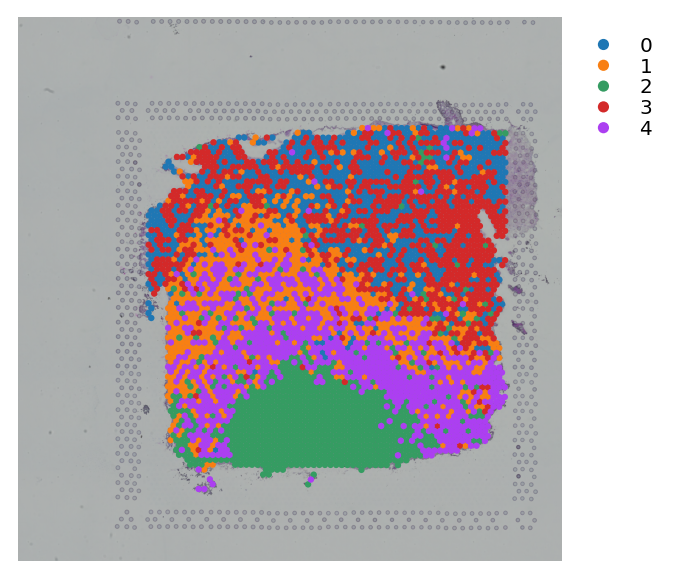

Running stLearn on 151673


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


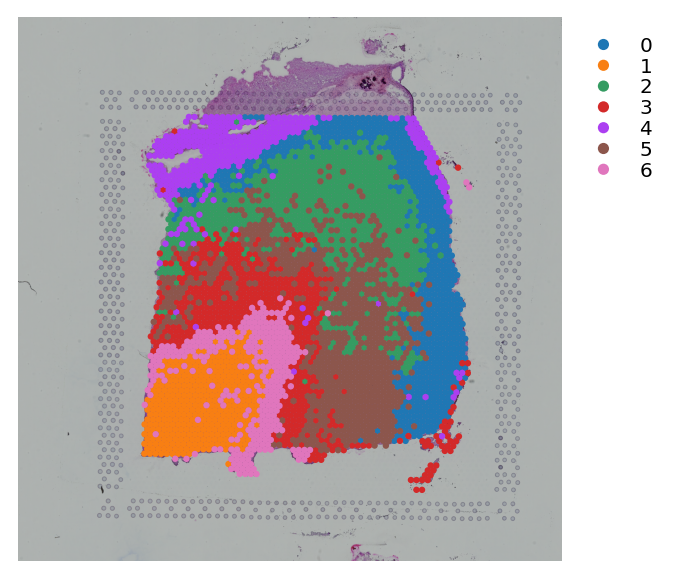

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


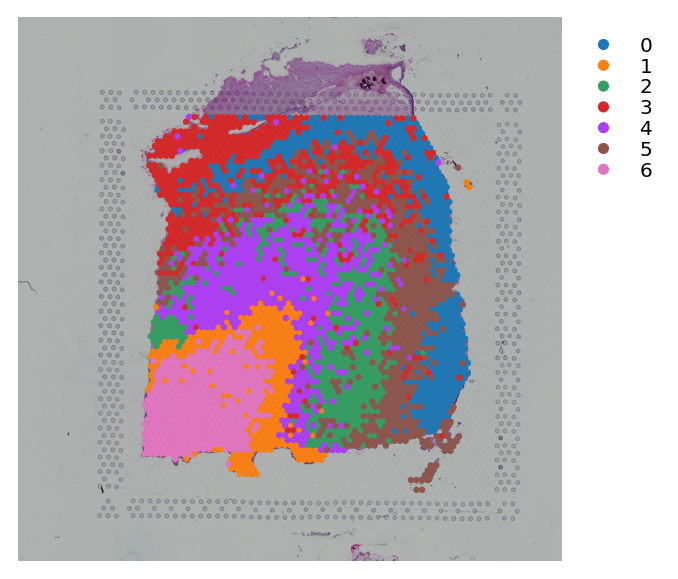

Running stLearn on 151674


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]  


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


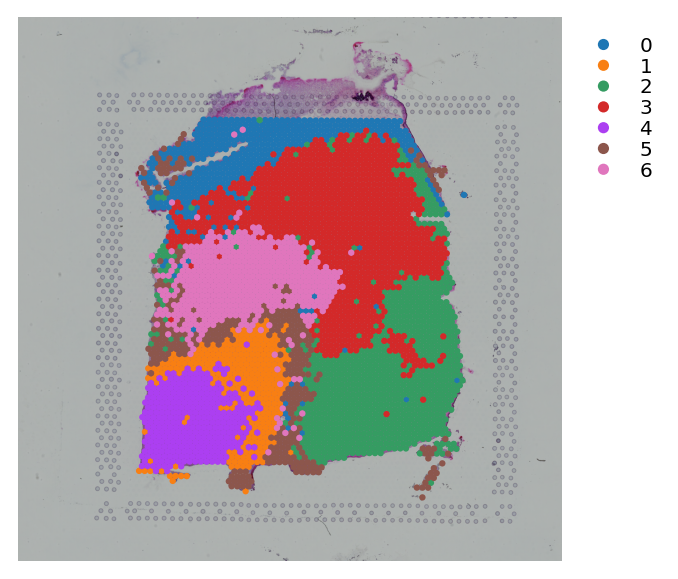

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


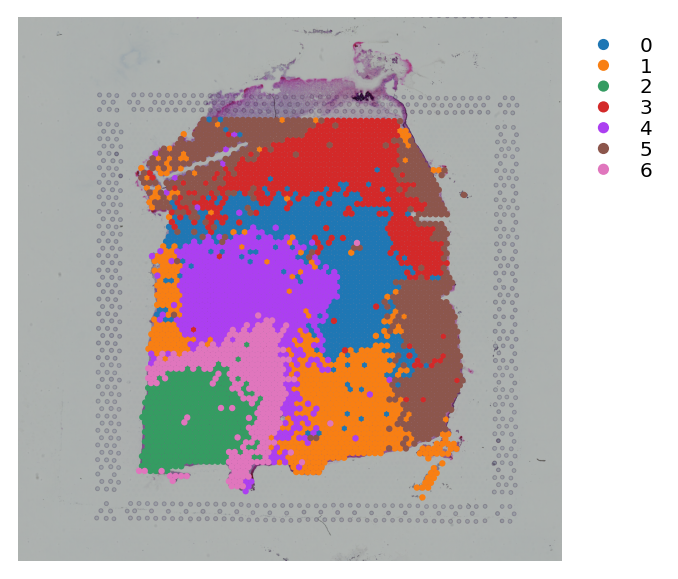

Running stLearn on 151675


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


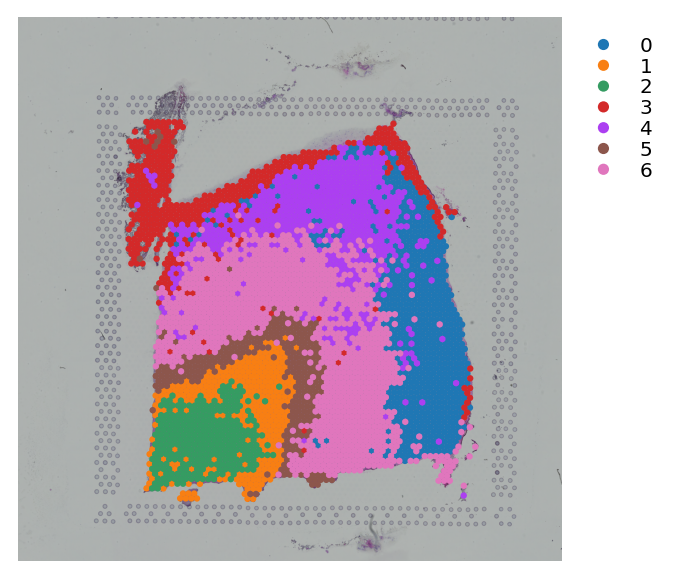

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


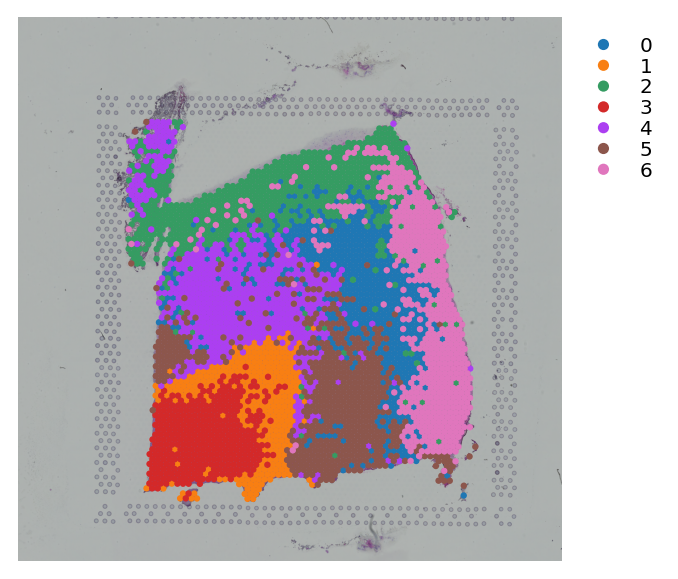

Running stLearn on 151676


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


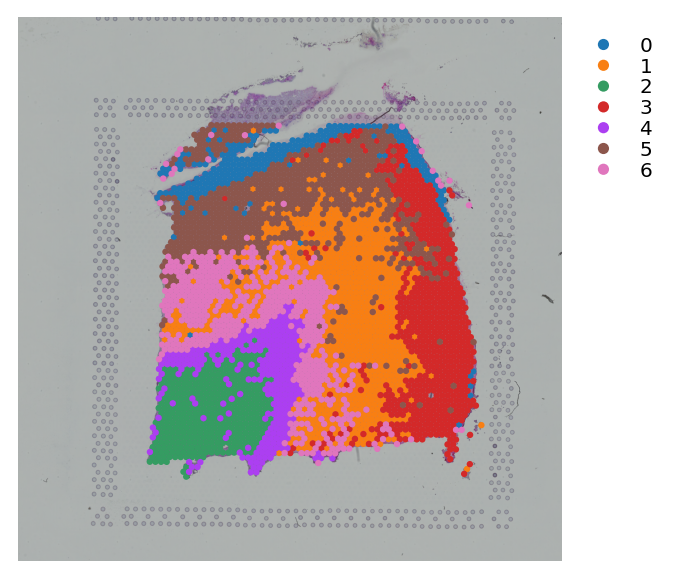

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...


/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:968: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect
  warnings.warn("'precompute_distances' was deprecated in version "
/home/mstone/.conda/envs/stLearn/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:973: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


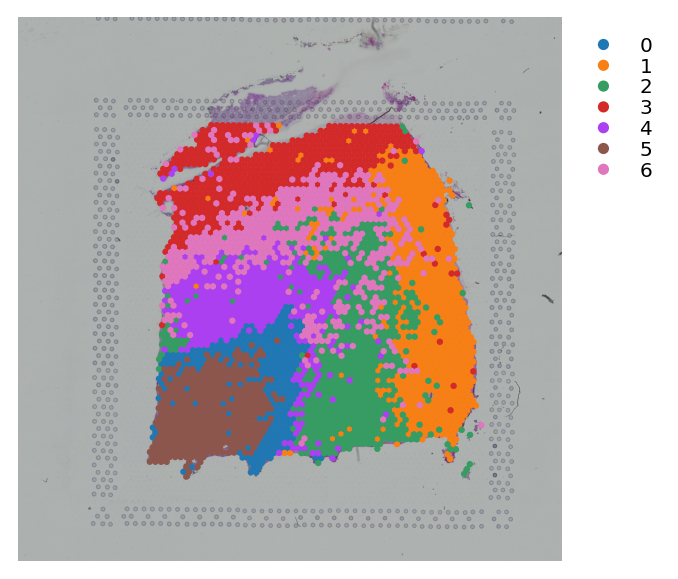

In [79]:
for sample in sorted(N_CLUSTERS.keys()):
    print(f"Running stLearn on {sample}")
    run_stLearn(sample)

In [55]:
data.obsm["X_morphology"].shape

(3639, 50)

In [56]:
data.obs.shape

(3639, 9)

In [57]:
data.obs.head()

,in_tissue,array_row,array_col,sum_counts,imagecol,imagerow,tile_path,X_pca_kmeans,X_umap_kmeans
AAACAAGTATCTCCCA-1,1,50,102,8458.0,1468.796865,1270.327020,/fh/fast/gottardo_r/data_transfer/spatial-data...,1,4
AAACAATCTACTAGCA-1,1,3,43,1667.0,865.436535,421.092105,/fh/fast/gottardo_r/data_transfer/spatial-data...,0,2
AAACACCAATAACTGC-1,1,59,19,3769.0,610.261020,1425.892575,/fh/fast/gottardo_r/data_transfer/spatial-data...,2,5
AAACAGAGCGACTCCT-1,1,14,94,5433.0,1390.789065,622.712265,/fh/fast/gottardo_r/data_transfer/spatial-data...,5,4
AAACAGCTTTCAGAAG-1,1,43,9,4278.0,509.000895,1137.563745,/fh/fast/gottardo_r/data_transfer/spatial-data...,6,6


In [81]:
data.shape

(3639, 19151)

In [84]:
data.obsm['X_morphology']

array([[-7.9757309e+00, -2.1580951e+00,  8.4770126e+00, ...,
        -9.1298950e-01,  2.2469130e-01, -3.7919652e-01],
       [ 2.2638306e+01,  4.5657568e+00,  7.7867875e+00, ...,
         1.7685834e+00, -4.8287530e+00,  9.5651274e+00],
       [ 1.7470561e+00,  8.9080591e+00, -1.2009409e+01, ...,
        -2.0790318e-01, -6.9288045e-01,  2.8085178e-01],
       ...,
       [-9.0151942e-01,  4.2675152e+00, -1.1160400e+01, ...,
         2.6012406e-01, -1.1413127e-02, -1.1424075e+00],
       [ 2.3054211e+01, -8.0678689e-01, -2.5108986e+00, ...,
         3.9678464e+00, -8.4410322e-01,  2.9371715e+00],
       [-4.4761281e+00, -5.8602295e+00,  2.3773241e-01, ...,
         8.2899153e-01,  3.5281301e-02,  3.6986947e-02]], dtype=float32)